In [ ]:
#  Import biblioteci

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from scipy import stats
from scipy.optimize import curve_fit
from scipy.stats import kstest, expon
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

# Stilizare grafice
plt.rcParams.update({
    'figure.facecolor':  'white',
    'axes.facecolor':    'white',
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.35,
    'grid.linestyle':    '--',
    'font.family':       'DejaVu Sans',
    'font.size':         11,
    'axes.titlesize':    13,
    'axes.titleweight':  'bold',
    'axes.labelsize':    11,
    'figure.dpi':        130,
})

CULORI = {
    'principal':  '#1a6faf',
    'secundar':   '#e05c2a',
    'tertiar':    '#2a9e6e',
    'highlight':  '#d4a017',
    'pericol':    '#c0392b',
    'fundal':     '#f7f9fc',
}

In [ ]:
#  Încărcare date în Colab

from google.colab import files
import io

print("Selectează fișierul CSV de pe calculatorul tău")
uploaded = files.upload()  # se deschide fereastra de upload

# Preia primul fișier încărcat
nume_fisier = list(uploaded.keys())[0]
df_raw = pd.read_csv(io.BytesIO(uploaded[nume_fisier]))
DATASET_REAL = True

print(f"Fișier încărcat: {nume_fisier}")
print(f"Dimensiuni: {df_raw.shape[0]:,} rânduri × {df_raw.shape[1]} coloane")
print(f"Coloane găsite: {list(df_raw.columns)}")

Selectează fișierul CSV de pe calculatorul tău


Saving Eartquakes-1990-2023.csv to Eartquakes-1990-2023.csv
Fișier încărcat: Eartquakes-1990-2023.csv
Dimensiuni: 3,445,751 rânduri × 12 coloane
Coloane găsite: ['time', 'place', 'status', 'tsunami', 'significance', 'data_type', 'magnitudo', 'state', 'longitude', 'latitude', 'depth', 'date']


In [ ]:
#  Curățare și preprocesare

# Verificare că df_raw există
try:
    df_raw
except NameError:
    raise RuntimeError(" df_raw nu e definit! Rulează mai întâi Bloc 2 și asigură-te că ai încărcat fișierul CSV.")

# Afișăm coloanele reale din fișier — util pentru debugging
print(" Coloane găsite în fișier:")
print(list(df_raw.columns))
print(f"   Shape: {df_raw.shape}\n")

df = df_raw.copy()

# Standardizare coloane — fix: 'time' și 'date' nu mai intră în conflict
rename_map = {}
for col in df.columns:
    c = col.lower().strip()
    if c in ['mag', 'magnitude', 'magnitudo']:
        rename_map[col] = 'magnitude'
    elif c in ['depth', 'adancime', 'profunzime']:
        rename_map[col] = 'depth'
    elif c in ['latitude', 'lat']:
        rename_map[col] = 'latitude'
    elif c in ['longitude', 'lon', 'long']:
        rename_map[col] = 'longitude'
    elif c in ['type', 'data_type', 'magtype']:
        rename_map[col] = 'data_type'
    # 'date' → 'year' | 'time' → ignorat (nu îl mai redenumim)
    elif c == 'date':
        rename_map[col] = 'year'

df.rename(columns=rename_map, inplace=True)
print(f" Coloane redenumite: {rename_map}")

# Convertire tipuri numerice
for col in ['magnitude', 'depth', 'latitude', 'longitude']:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Extragere an din coloana 'date' (acum redenumită 'year')
if 'year' in df.columns:
    col_year = df['year']
    # Dacă e tot DataFrame din cauza duplicatelor, luăm prima coloană
    if isinstance(col_year, pd.DataFrame):
        col_year = col_year.iloc[:, 0]
    if col_year.dtype == object:
        col_year = pd.to_datetime(col_year, errors='coerce').dt.year
    df['year'] = pd.to_numeric(col_year, errors='coerce')

# Filtrare: doar cutremure reale
if 'data_type' in df.columns:
    df = df[df['data_type'].str.lower().str.contains('earthquake', na=False)]

# Filtrare magnitudini valide
df = df[df['magnitude'].notna()].copy()
df = df[df['magnitude'] >= 2.0].copy()
df = df[df['magnitude'] <= 10.0].copy()

# Filtrare adâncimi valide
if 'depth' in df.columns:
    df = df[df['depth'].notna()].copy()
    df = df[(df['depth'] >= 0) & (df['depth'] <= 750)].copy()

df.reset_index(drop=True, inplace=True)

print(f"\n Date după curățare:")
print(f"   Număr cutremure : {len(df):,}")
print(f"   Magnitudine min : {df['magnitude'].min():.1f}")
print(f"   Magnitudine max : {df['magnitude'].max():.1f}")
if 'year' in df.columns and df['year'].notna().any():
    print(f"   Perioadă        : {int(df['year'].min())} – {int(df['year'].max())}")
print(f"   Coloane finale  : {list(df.columns)}")

 Coloane găsite în fișier:
['time', 'place', 'status', 'tsunami', 'significance', 'data_type', 'magnitudo', 'state', 'longitude', 'latitude', 'depth', 'date']
   Shape: (3445751, 12)

 Coloane redenumite: {'data_type': 'data_type', 'magnitudo': 'magnitude', 'longitude': 'longitude', 'latitude': 'latitude', 'depth': 'depth', 'date': 'year'}

 Date după curățare:
   Număr cutremure : 1,052,631
   Magnitudine min : 2.0
   Magnitudine max : 9.1
   Perioadă        : 1990 – 2023
   Coloane finale  : ['time', 'place', 'status', 'tsunami', 'significance', 'data_type', 'magnitude', 'state', 'longitude', 'latitude', 'depth', 'year']


════════════════════════════════════════════════════════════
  STATISTICĂ DESCRIPTIVĂ — MAGNITUDINI
════════════════════════════════════════════════════════════
  N total                             1,052,631
  Medie (μ)                           3.3391
  Mediană                             3.1000
  Deviație standard (σ)               1.0440
  Asimetrie (skewness)                0.3793
  Exces de curtoză                    -1.0297
  Q1 / Q3                             2.380 / 4.300
  P95 / P99                           5.000 / 5.600
  Min / Max                           2.0 / 9.1

  Distribuție pe clase:
  Minor    (2.0–3.9)         669,370    63.59%  ███████████████████████████████
  Ușor     (4.0–4.9)         327,913    31.15%  ███████████████
  Moderat  (5.0–5.9)          49,893     4.74%  ██
  Puternic (6.0–6.9)           4,437     0.42%  
  Major    (7.0–7.9)             464     0.04%  
  Uriaș    (8.0+)                 33     0.00%  


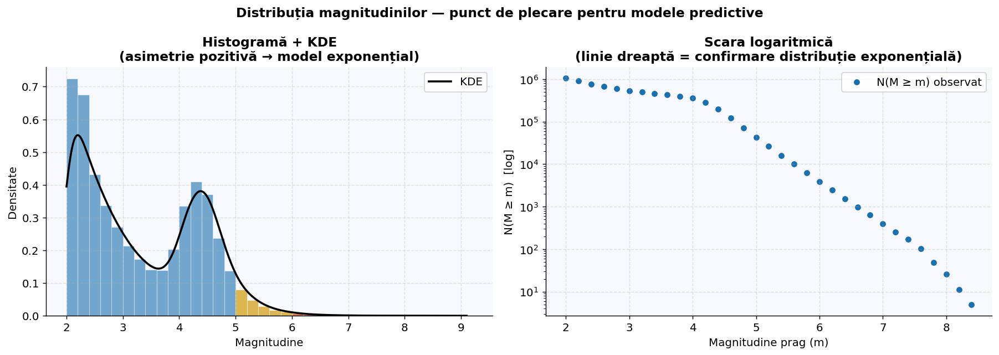

In [ ]:
#  STATISTICĂ DESCRIPTIVĂ + DISTRIBUȚIE

#  Fundația pentru toate modelele predictive de mai jos

M = df['magnitude']

print("═"*60)
print("  STATISTICĂ DESCRIPTIVĂ — MAGNITUDINI")
print("═"*60)
desc = {
    'N total':                      f"{len(M):,}",
    'Medie (μ)':                    f"{M.mean():.4f}",
    'Mediană':                      f"{M.median():.4f}",
    'Deviație standard (σ)':        f"{M.std():.4f}",
    'Asimetrie (skewness)':         f"{M.skew():.4f}",
    'Exces de curtoză':             f"{M.kurtosis():.4f}",
    'Q1 / Q3':                      f"{M.quantile(0.25):.3f} / {M.quantile(0.75):.3f}",
    'P95 / P99':                    f"{M.quantile(0.95):.3f} / {M.quantile(0.99):.3f}",
    'Min / Max':                    f"{M.min():.1f} / {M.max():.1f}",
}
for k, v in desc.items():
    print(f"  {k:<35} {v}")

praguri = [
    (2.0, 3.9,  "Minor    (2.0–3.9)"),
    (4.0, 4.9,  "Ușor     (4.0–4.9)"),
    (5.0, 5.9,  "Moderat  (5.0–5.9)"),
    (6.0, 6.9,  "Puternic (6.0–6.9)"),
    (7.0, 7.9,  "Major    (7.0–7.9)"),
    (8.0, 10.0, "Uriaș    (8.0+)"),
]
print("\n  Distribuție pe clase:")
for m_min, m_max, eticheta in praguri:
    nr  = ((M >= m_min) & (M <= m_max)).sum()
    pct = 100 * nr / len(M)
    print(f"  {eticheta:<25} {nr:>8,}   {pct:>6.2f}%  {'█' * int(pct/2)}")

# ── Grafic: Histogramă + KDE ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Distribuția magnitudinilor — punct de plecare pentru modele predictive",
             fontsize=13, fontweight='bold')

ax = axes[0]
ax.set_facecolor('#f7f9fc')
bins = np.arange(M.min(), M.max() + 0.2, 0.2)
n_hist, edges, patches = ax.hist(M, bins=bins, density=True,
                                  color='#1a6faf', alpha=0.6,
                                  edgecolor='white', linewidth=0.4)
for patch, le in zip(patches, edges[:-1]):
    if le >= 7.0:   patch.set_facecolor('#c0392b'); patch.set_alpha(0.9)
    elif le >= 6.0: patch.set_facecolor('#e05c2a'); patch.set_alpha(0.8)
    elif le >= 5.0: patch.set_facecolor('#d4a017'); patch.set_alpha(0.75)

kde_x = np.linspace(M.min(), M.max(), 500)
kde   = stats.gaussian_kde(M, bw_method=0.15)
ax.plot(kde_x, kde(kde_x), color='black', linewidth=2, label='KDE')
ax.set_xlabel("Magnitudine"); ax.set_ylabel("Densitate")
ax.set_title("Histogramă + KDE\n(asimetrie pozitivă → model exponențial)")
ax.legend()

# ── Scară log — prima dovadă a legii Gutenberg-Richter ──
ax2 = axes[1]
ax2.set_facecolor('#f7f9fc')
M_bins  = np.arange(2.0, 8.5, 0.2)
N_cumul = np.array([(M >= m).sum() for m in M_bins])
mask    = N_cumul > 0
ax2.scatter(M_bins[mask], N_cumul[mask], color='#1a6faf', s=25, label='N(M ≥ m) observat')
ax2.set_yscale('log')
ax2.set_xlabel("Magnitudine prag (m)")
ax2.set_ylabel("N(M ≥ m)  [log]")
ax2.set_title("Scara logaritmică\n(linie dreaptă = confirmare distribuție exponențială)")
ax2.legend()

plt.tight_layout()
plt.savefig('fig1_distributie.png', dpi=130, bbox_inches='tight')
plt.show()

════════════════════════════════════════════════════════════
  COMPARAȚIE MODELE — TRAIN/TEST SPLIT
  Train: 1990–2018  |  Test: 2019–2023
════════════════════════════════════════════════════════════

  Date antrenare: 839,911 cutremure (1990–2018)
  Date testare:   184,285  cutremure (2019–2023)

  MODEL 1 — Gutenberg-Richter (OLS log-liniar)
    Ecuație:  log₁₀N = 8.1073 – 0.7717·m
    R² train: 0.946818
    RMSE test:0.876879  (log scale)
    MAE test: 0.803848  (log scale)
    AIC:      36.3158

  MODEL 2 — Regresie exponențială (curve_fit)
    Ecuație:  N = exp(15.0717 – 0.7064·m)
    R² train: 0.313017
    RMSE test:1.816561  (log scale)
    MAE test: 1.543670  (log scale)
    AIC:      1456.6427

  MODEL 3 — Pareto Generalizat GPD (coada M≥5.0)
    ξ shape:  0.1993  (coadă groasă)
    σ scale:  0.3003
    R² test (ECDF): 0.911322
    Log-lik mediu test: 0.1293
    AIC:      -331.3066
  ------------------------------------------------------------
  VERDICT COMPARATIV
  Model     

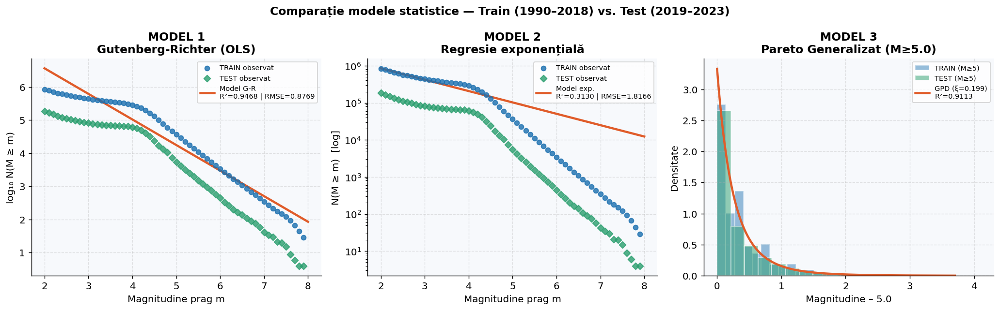

fig2_comparatie_modele.png


In [ ]:
#  COMPARAȚIE MODELE STATISTICE

#  Întrebarea: Care model descrie cel mai bine
#  distribuția magnitudinilor și poate fi folosit
#  pentru estimarea probabilității unui cutremur viitor?
#
#  Modele comparate:
#    1. Gutenberg-Richter (regresie log-liniară OLS)
#    2. Regresie exponențială directă (curve_fit)
#    3. Distribuție Pareto Generalizată (GPD) — coadă groasă
#
#  Metodă: split train(1990–2018) / test(2019–2023)
#  Metrici: R², RMSE, MAE, Log-Likelihood, AIC

from scipy.stats import genpareto
from scipy.optimize import curve_fit
import statsmodels.api as sm

print("═"*60)
print("  COMPARAȚIE MODELE — TRAIN/TEST SPLIT")
print("  Train: 1990–2018  |  Test: 2019–2023")
print("═"*60)

# ── Split temporal ──
AN_SPLIT = 2019
df_train = df[df['year'] <  AN_SPLIT].copy()
df_test  = df[df['year'] >= AN_SPLIT].copy()
M_train  = df_train['magnitude']
M_test   = df_test['magnitude']

print(f"\n  Date antrenare: {len(df_train):,} cutremure ({int(df_train['year'].min())}–{AN_SPLIT-1})")
print(f"  Date testare:   {len(df_test):,}  cutremure ({AN_SPLIT}–{int(df_test['year'].max())})")

# ── Calculăm N(M ≥ m) pentru train și test ──
M_praguri  = np.arange(2.0, 8.0, 0.1)
N_train    = np.array([(M_train >= m).sum() for m in M_praguri])
N_test     = np.array([(M_test  >= m).sum() for m in M_praguri])
mask       = N_train >= 3
M_fit      = M_praguri[mask]
N_fit      = N_train[mask]
log10_N_fit = np.log10(N_fit)


#  MODEL 1: Gutenberg-Richter OLS

X_reg    = sm.add_constant(M_fit)
model_gr = sm.OLS(log10_N_fit, X_reg).fit()
a_gr = model_gr.params[0]
b_gr = -model_gr.params[1]

# Predicție pe TEST
log10_N_test_obs  = np.log10(np.maximum(N_test[mask], 1))
log10_N_test_pred = a_gr - b_gr * M_fit

r2_gr   = model_gr.rsquared
rmse_gr = np.sqrt(np.mean((log10_N_test_obs - log10_N_test_pred)**2))
mae_gr  = np.mean(np.abs(log10_N_test_obs  - log10_N_test_pred))
aic_gr  = model_gr.aic

print(f"\n  MODEL 1 — Gutenberg-Richter (OLS log-liniar)")
print(f"    Ecuație:  log₁₀N = {a_gr:.4f} – {b_gr:.4f}·m")
print(f"    R² train: {r2_gr:.6f}")
print(f"    RMSE test:{rmse_gr:.6f}  (log scale)")
print(f"    MAE test: {mae_gr:.6f}  (log scale)")
print(f"    AIC:      {aic_gr:.4f}")

#  MODEL 2: Regresie exponențială

def model_exp(m, alpha, beta):
    return np.exp(alpha - beta * m)

popt_exp, pcov_exp = curve_fit(
    model_exp, M_fit, N_fit,
    p0=[a_gr * np.log(10), b_gr * np.log(10)],
    maxfev=10000
)
alpha_exp, beta_exp = popt_exp

N_pred_exp_train = model_exp(M_fit, *popt_exp)
N_pred_exp_test  = model_exp(M_fit, *popt_exp)

# Metrici în spațiul log pentru comparabilitate
log_pred_exp = np.log10(np.maximum(N_pred_exp_test, 1))
r2_exp  = 1 - np.sum((log10_N_fit - np.log10(np.maximum(N_pred_exp_train,1)))**2) / \
              np.sum((log10_N_fit - log10_N_fit.mean())**2)
rmse_exp = np.sqrt(np.mean((log10_N_test_obs - log_pred_exp)**2))
mae_exp  = np.mean(np.abs(log10_N_test_obs   - log_pred_exp))
# AIC manual pentru regresie neliniară
resid_exp = N_fit - N_pred_exp_train
sigma2_exp = np.var(resid_exp)
ll_exp     = -0.5 * len(N_fit) * (np.log(2*np.pi*sigma2_exp) + 1)
aic_exp    = 2*2 - 2*ll_exp  # 2 parametri

print(f"\n  MODEL 2 — Regresie exponențială (curve_fit)")
print(f"    Ecuație:  N = exp({alpha_exp:.4f} – {beta_exp:.4f}·m)")
print(f"    R² train: {r2_exp:.6f}")
print(f"    RMSE test:{rmse_exp:.6f}  (log scale)")
print(f"    MAE test: {mae_exp:.6f}  (log scale)")
print(f"    AIC:      {aic_exp:.4f}")


#  MODEL 3: Distribuție Pareto Generalizată
#  (pentru coada distribuției — cutremure mari)

PRAG_GPD = 5.0  # analizăm coada de la M≥5
M_coada_train = M_train[M_train >= PRAG_GPD] - PRAG_GPD
M_coada_test  = M_test[M_test   >= PRAG_GPD] - PRAG_GPD

c_gpd, loc_gpd, scale_gpd = genpareto.fit(M_coada_train, floc=0)

# Log-likelihood pe test
ll_test_gpd = genpareto.logpdf(M_coada_test, c_gpd, loc_gpd, scale_gpd)
ll_test_gpd = ll_test_gpd[np.isfinite(ll_test_gpd)].mean()
aic_gpd     = 2*2 - 2 * genpareto.logpdf(M_coada_train, c_gpd, loc_gpd, scale_gpd).sum()

# R² GPD — comparăm ECDF observat vs. teoretic pe date test
ecdf_obs  = np.arange(1, len(M_coada_test)+1) / len(M_coada_test)
ecdf_teor = genpareto.cdf(np.sort(M_coada_test), c_gpd, loc_gpd, scale_gpd)
ss_res_gpd = np.sum((ecdf_obs - ecdf_teor)**2)
ss_tot_gpd = np.sum((ecdf_obs - ecdf_obs.mean())**2)
r2_gpd     = 1 - ss_res_gpd / ss_tot_gpd

print(f"\n  MODEL 3 — Pareto Generalizat GPD (coada M≥{PRAG_GPD})")
print(f"    ξ shape:  {c_gpd:.4f}  "
      f"({'coadă groasă' if c_gpd>0 else 'coadă ușoară'})")
print(f"    σ scale:  {scale_gpd:.4f}")
print(f"    R² test (ECDF): {r2_gpd:.6f}")
print(f"    Log-lik mediu test: {ll_test_gpd:.4f}")
print(f"    AIC:      {aic_gpd:.4f}")


#  TABEL COMPARATIV FINAL

print(f"  {'-'*60}")
print(f"  VERDICT COMPARATIV")
print(f"  {'Model':<35} {'R²':>8} {'RMSE':>8} {'MAE':>8} {'AIC':>10}")
print(f"  {'-'*60}")
print(f"  {'1. Gutenberg-Richter (OLS)':<35} {r2_gr:>8.5f} {rmse_gr:>8.5f} {mae_gr:>8.5f} {aic_gr:>10.2f}")
print(f"  {'2. Exponențial (curve_fit)':<35} {r2_exp:>8.5f} {rmse_exp:>8.5f} {mae_exp:>8.5f} {aic_exp:>10.2f}")
print(f"  {'3. GPD (coada M≥5)':<35} {r2_gpd:>8.5f} {'N/A':>8} {'N/A':>8} {aic_gpd:>10.2f}")

# Câștigător după RMSE (mai mic = mai bun)
rmse_dict = {'Gutenberg-Richter': rmse_gr, 'Exponențial': rmse_exp}
castigator = min(rmse_dict, key=rmse_dict.get)
print(f"\n   CEL MAI BUN MODEL (RMSE minim): {castigator}")
print(f"     → Folosit pentru predicțiile următoare")


#  GRAFIC COMPARAȚIE VIZUALĂ

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Comparație modele statistice — Train (1990–2018) vs. Test (2019–2023)",
             fontsize=13, fontweight='bold')

M_linie = np.linspace(2.0, 8.0, 300)

# ── 1. Gutenberg-Richter ──
ax = axes[0]
ax.set_facecolor('#f7f9fc')
ax.scatter(M_fit, log10_N_fit, color='#1a6faf', s=30,
           label='TRAIN observat', zorder=5, alpha=0.8)
ax.scatter(M_fit, log10_N_test_obs, color='#2a9e6e', s=30, marker='D',
           label='TEST observat', zorder=5, alpha=0.8)
ax.plot(M_linie, a_gr - b_gr * M_linie,
        color='#e05c2a', linewidth=2.5,
        label=f'Model G-R\nR²={r2_gr:.4f} | RMSE={rmse_gr:.4f}')
ax.set_xlabel("Magnitudine prag m")
ax.set_ylabel("log₁₀ N(M ≥ m)")
ax.set_title("MODEL 1\nGutenberg-Richter (OLS)")
ax.legend(fontsize=8)

# ── 2. Exponențial ──
ax = axes[1]
ax.set_facecolor('#f7f9fc')
ax.scatter(M_fit, N_fit, color='#1a6faf', s=30,
           label='TRAIN observat', zorder=5, alpha=0.8)
ax.scatter(M_fit, N_test[mask], color='#2a9e6e', s=30, marker='D',
           label='TEST observat', zorder=5, alpha=0.8)
ax.plot(M_linie, model_exp(M_linie, *popt_exp),
        color='#e05c2a', linewidth=2.5,
        label=f'Model exp.\nR²={r2_exp:.4f} | RMSE={rmse_exp:.4f}')
ax.set_yscale('log')
ax.set_xlabel("Magnitudine prag m")
ax.set_ylabel("N(M ≥ m)  [log]")
ax.set_title("MODEL 2\nRegresie exponențială")
ax.legend(fontsize=8)

# ── 3. GPD pe coadă ──
ax = axes[2]
ax.set_facecolor('#f7f9fc')
x_gpd  = np.linspace(0, M_coada_test.max() + 0.5, 300)
ax.hist(M_coada_train, bins=30, density=True,
        color='#1a6faf', alpha=0.45, edgecolor='white',
        label='TRAIN (M≥5)')
ax.hist(M_coada_test,  bins=15, density=True,
        color='#2a9e6e', alpha=0.5, edgecolor='white',
        label='TEST (M≥5)')
ax.plot(x_gpd, genpareto.pdf(x_gpd, c_gpd, loc_gpd, scale_gpd),
        color='#e05c2a', linewidth=2.5,
        label=f'GPD (ξ={c_gpd:.3f})\nR²={r2_gpd:.4f}')
ax.set_xlabel("Magnitudine – 5.0")
ax.set_ylabel("Densitate")
ax.set_title(f"MODEL 3\nPareto Generalizat (M≥{PRAG_GPD})")
ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig('fig2_comparatie_modele.png', dpi=130, bbox_inches='tight')
plt.show()
print("fig2_comparatie_modele.png")

  Serie lunară M≥4: 396 luni  | medie=964.6/lună | std=353.3
  Serie lunară M≥5: 396 luni  | medie=138.0/lună | std=52.5


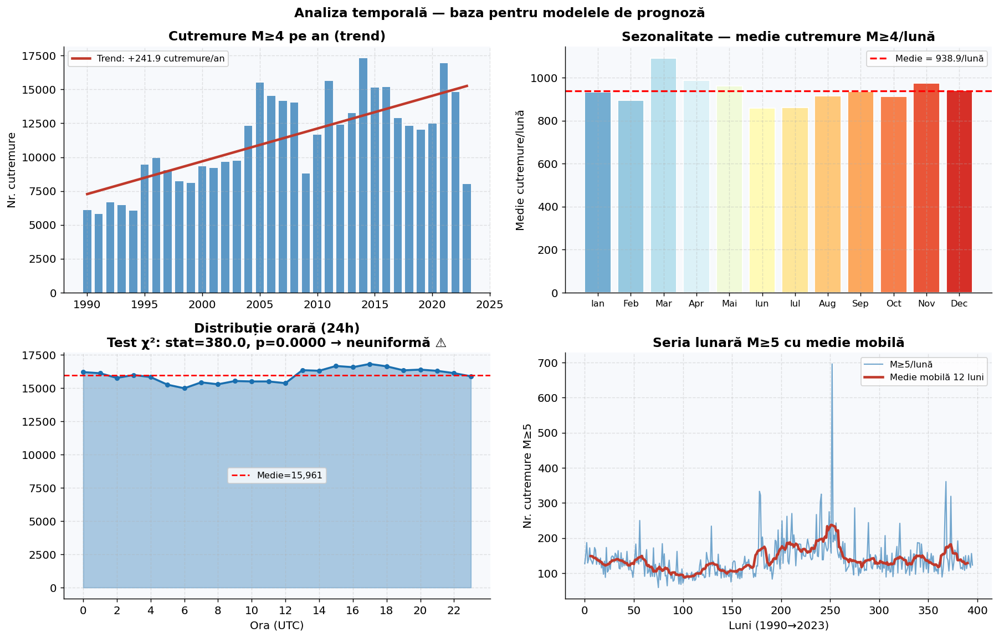

fig3_analiza_temporala.png


In [ ]:
#  ANALIZĂ TEMPORALĂ + SEZONALITATE

#  Pregătim seria de timp lunară pentru prognoză

df_timp = df_raw.copy()
df_timp['magnitude'] = pd.to_numeric(df_timp['magnitudo'], errors='coerce')
df_timp = df_timp[df_timp['magnitude'] >= 2.0].dropna(subset=['magnitude'])
df_timp['datetime'] = pd.to_datetime(df_timp['time'], unit='ms', errors='coerce')
df_timp = df_timp.dropna(subset=['datetime'])
df_timp['an_luna']  = df_timp['datetime'].dt.to_period('M')
df_timp['luna']     = df_timp['datetime'].dt.month
df_timp['ora']      = df_timp['datetime'].dt.hour
df_timp['an']       = df_timp['datetime'].dt.year

# Serie lunară: nr. cutremure M≥4 și M≥5 pe lună
serie_m4 = (df_timp[df_timp['magnitude'] >= 4.0]
            .groupby('an_luna').size()
            .sort_index())
serie_m5 = (df_timp[df_timp['magnitude'] >= 5.0]
            .groupby('an_luna').size()
            .sort_index())

# Eliminăm lunile incomplete (primele și ultimele)
serie_m4 = serie_m4.iloc[1:-1]
serie_m5 = serie_m5.iloc[1:-1]

print(f"  Serie lunară M≥4: {len(serie_m4)} luni  "
      f"| medie={serie_m4.mean():.1f}/lună | std={serie_m4.std():.1f}")
print(f"  Serie lunară M≥5: {len(serie_m5)} luni  "
      f"| medie={serie_m5.mean():.1f}/lună | std={serie_m5.std():.1f}")

# ── Sezonalitate lunară ──
df_tmp2 = df_timp[df_timp['magnitude'] >= 4.0].copy()
cnt_luna_med = df_tmp2.groupby('luna').size() / df_tmp2['an'].nunique()

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
fig.suptitle("Analiza temporală — baza pentru modelele de prognoză",
             fontsize=13, fontweight='bold')

# ── Nr. cutremure M≥4 pe an ──
ax = axes[0, 0]
ax.set_facecolor('#f7f9fc')
ann = df_timp[df_timp['magnitude'] >= 4.0].groupby('an').size()
ax.bar(ann.index, ann.values, color='#1a6faf', alpha=0.7, width=0.7)
# Trend liniar
z = np.polyfit(ann.index, ann.values, 1)
ax.plot(ann.index, np.polyval(z, ann.index),
        color='#c0392b', linewidth=2.5,
        label=f'Trend: {z[0]:+.1f} cutremure/an')
ax.set_title("Cutremure M≥4 pe an (trend)")
ax.set_ylabel("Nr. cutremure")
ax.legend(fontsize=9)

# ── Sezonalitate: medie lunară ──
ax = axes[0, 1]
ax.set_facecolor('#f7f9fc')
luni_ro = ['Ian','Feb','Mar','Apr','Mai','Iun',
           'Iul','Aug','Sep','Oct','Nov','Dec']
culori_bar = plt.cm.RdYlBu_r(np.linspace(0.2, 0.9, 12))
ax.bar(range(1, 13), cnt_luna_med.values,
       color=culori_bar, edgecolor='white')
ax.axhline(cnt_luna_med.mean(), color='red', linestyle='--',
           linewidth=1.8, label=f'Medie = {cnt_luna_med.mean():.1f}/lună')
ax.set_xticks(range(1, 13))
ax.set_xticklabels(luni_ro, fontsize=9)
ax.set_title("Sezonalitate — medie cutremure M≥4/lună")
ax.set_ylabel("Medie cutremure/lună")
ax.legend(fontsize=9)

# ── Distribuție orară — test aleatorietate ──
ax = axes[1, 0]
ax.set_facecolor('#f7f9fc')
cnt_ora = df_tmp2['ora'].value_counts().sort_index()
ax.fill_between(cnt_ora.index, cnt_ora.values,
                color='#1a6faf', alpha=0.35)
ax.plot(cnt_ora.index, cnt_ora.values,
        color='#1a6faf', linewidth=2, marker='o', markersize=4)
ax.axhline(cnt_ora.mean(), color='red', linestyle='--',
           linewidth=1.5, label=f'Medie={cnt_ora.mean():,.0f}')
chi2_stat = np.sum((cnt_ora.values - cnt_ora.mean())**2 / cnt_ora.mean())
p_chi2    = 1 - stats.chi2.cdf(chi2_stat, df=23)
ax.set_title(f"Distribuție orară (24h)\nTest χ²: stat={chi2_stat:.1f}, p={p_chi2:.4f}"
             f" → {'uniformă ✅' if p_chi2>0.05 else 'neuniformă ⚠️'}")
ax.set_xticks(range(0, 24, 2))
ax.set_xlabel("Ora (UTC)")
ax.legend(fontsize=9)

# ── Seria lunară M≥5 ──
ax = axes[1, 1]
ax.set_facecolor('#f7f9fc')
x_idx = np.arange(len(serie_m5))
ax.plot(x_idx, serie_m5.values,
        color='#1a6faf', linewidth=1.2, alpha=0.6, label='M≥5/lună')
# Media mobilă 12 luni
mm12 = pd.Series(serie_m5.values).rolling(12, center=True).mean()
ax.plot(x_idx, mm12,
        color='#c0392b', linewidth=2.5, label='Medie mobilă 12 luni')
ax.set_title("Seria lunară M≥5 cu medie mobilă")
ax.set_ylabel("Nr. cutremure M≥5")
ax.set_xlabel("Luni (1990→2023)")
ax.legend(fontsize=9)

plt.tight_layout()
plt.savefig('fig3_analiza_temporala.png', dpi=130, bbox_inches='tight')
plt.show()
print("fig3_analiza_temporala.png")

  Tip index serie_m5: <class 'pandas._libs.tslibs.period.Period'>
  Primele 3 valori index: [Period('1990-02', 'M'), Period('1990-03', 'M'), Period('1990-04', 'M')]
  Lungime serie: 396

  idx_split calculat: 366
  Train: 366 luni  |  Test: 30 luni
════════════════════════════════════════════════════════════
  COMPARAȚIE MODELE PROGNOZĂ
  Train: 1990–2020 (366 luni)
  Test:  2021–2023  (30 luni)
════════════════════════════════════════════════════════════

  MODEL A — Regresie liniară:        RMSE=59.39  MAE=37.17  MAPE=21.9%
  MODEL B — Poisson λ=136.82:       RMSE=61.22  MAE=32.45  MAPE=16.7%
  MODEL C — EWM α=0.15:            RMSE=63.26  MAE=40.79  MAPE=23.8%
  MODEL D — Polinomial grad 2:       RMSE=60.04  MAE=32.38  MAPE=17.1%

════════════════════════════════════════════════════════════
  Model                         RMSE      MAE     MAPE  Rang
  -------------------------------------------------------
  A. Liniar                   59.388   37.175    21.9%  #1 🏆
  D. Polinomial 

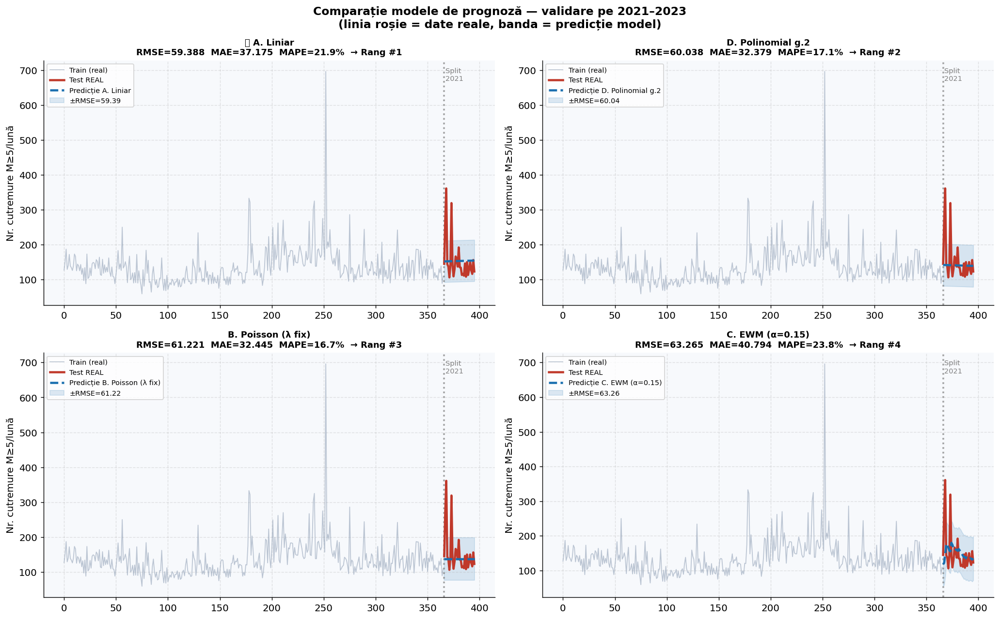

fig4_comparatie_prognoze.png


In [ ]:
#  COMPARAȚIE MODELE DE PROGNOZĂ

#  Răspunde la întrebarea principală:
#  "Care model estimează cel mai bine numărul de
#   cutremure din lunile viitoare?"
#
#  Modele testate:
#    A. Regresie liniară pe trend temporal
#    B. Medie Poisson (rata λ constantă)
#    C. Medie mobilă exponențială (EWM)
#    D. Regresie polinomială grad 2 (trend curbiliniu)
#
#  Validare: antrenăm pe 1990–2020, testăm pe 2021–2023
#  Metrici: RMSE, MAE, MAPE (Mean Absolute % Error)

AN_TEST_SERIE = 2021

# ── Diagnostic ──
print(f"  Tip index serie_m5: {type(serie_m5.index[0])}")
print(f"  Primele 3 valori index: {list(serie_m5.index[:3])}")
print(f"  Lungime serie: {len(serie_m5)}")

# ── Split robust — convertim indexul la string pentru comparație sigură ──
valori   = serie_m5.values.astype(float)
perioade = np.arange(len(valori))

# Extragem anul din fiecare perioadă indiferent de format
ani_serie = np.array([
    int(str(p)[:4]) for p in serie_m5.index
])

idx_split  = int(np.sum(ani_serie < AN_TEST_SERIE))
train_vals = valori[:idx_split]
test_vals  = valori[idx_split:]
train_idx  = perioade[:idx_split]
test_idx   = perioade[idx_split:]

# ── Verificare că split-ul e valid ──
print(f"\n  idx_split calculat: {idx_split}")
print(f"  Train: {len(train_vals)} luni  |  Test: {len(test_vals)} luni")

if len(train_vals) == 0:
    raise RuntimeError(
        f"   Train set gol! Verifică dacă seria lunară (serie_m5) "
        f"conține date înainte de {AN_TEST_SERIE}.\n"
        f"   Ani disponibili în serie: {sorted(set(ani_serie))[:5]}  "
        f"{sorted(set(ani_serie))[-3:]}"
    )
if len(test_vals) == 0:
    raise RuntimeError(
        f"   Test set gol! Nu există date după {AN_TEST_SERIE}.\n"
        f"   Ultimul an din serie: {ani_serie[-1]}"
    )

print("═"*60)
print(f"  COMPARAȚIE MODELE PROGNOZĂ")
print(f"  Train: 1990–{AN_TEST_SERIE-1} ({len(train_vals)} luni)")
print(f"  Test:  {AN_TEST_SERIE}–2023  ({len(test_vals)} luni)")
print("═"*60)

rezultate = {}


#  MODEL A — Regresie liniară

coef_lin  = np.polyfit(train_idx, train_vals, 1)
pred_A    = np.polyval(coef_lin, test_idx)
pred_A    = np.maximum(pred_A, 0)

rmse_A = np.sqrt(np.mean((test_vals - pred_A)**2))
mae_A  = np.mean(np.abs(test_vals - pred_A))
mape_A = np.mean(np.abs((test_vals - pred_A) / np.maximum(test_vals, 1))) * 100
rezultate['A. Liniar'] = {'rmse': rmse_A, 'mae': mae_A, 'mape': mape_A,
                           'pred': pred_A, 'coef': coef_lin}
print(f"\n  MODEL A — Regresie liniară:        RMSE={rmse_A:.2f}  MAE={mae_A:.2f}  MAPE={mape_A:.1f}%")


#  MODEL B — Poisson (λ = medie)

lambda_poisson = train_vals.mean()
pred_B         = np.full(len(test_vals), lambda_poisson)

rmse_B = np.sqrt(np.mean((test_vals - pred_B)**2))
mae_B  = np.mean(np.abs(test_vals - pred_B))
mape_B = np.mean(np.abs((test_vals - pred_B) / np.maximum(test_vals, 1))) * 100
rezultate['B. Poisson (λ fix)'] = {'rmse': rmse_B, 'mae': mae_B, 'mape': mape_B,
                                    'pred': pred_B}
print(f"  MODEL B — Poisson λ={lambda_poisson:.2f}:       RMSE={rmse_B:.2f}  MAE={mae_B:.2f}  MAPE={mape_B:.1f}%")


#  MODEL C — Medie mobilă exp.

alpha_ewm = 0.15
ewm_train = pd.Series(train_vals).ewm(alpha=alpha_ewm, adjust=False).mean()
ultima_val = ewm_train.iloc[-1]
pred_C     = np.full(len(test_vals), ultima_val)
# Actualizăm recursiv pe perioada de test (one-step-ahead)
pred_C_rec = []
val_curent = ultima_val
for vt in test_vals:
    pred_C_rec.append(val_curent)
    val_curent = alpha_ewm * vt + (1 - alpha_ewm) * val_curent
pred_C = np.array(pred_C_rec)

rmse_C = np.sqrt(np.mean((test_vals - pred_C)**2))
mae_C  = np.mean(np.abs(test_vals - pred_C))
mape_C = np.mean(np.abs((test_vals - pred_C) / np.maximum(test_vals, 1))) * 100
rezultate['C. EWM (α=0.15)'] = {'rmse': rmse_C, 'mae': mae_C, 'mape': mape_C,
                                  'pred': pred_C}
print(f"  MODEL C — EWM α={alpha_ewm}:            RMSE={rmse_C:.2f}  MAE={mae_C:.2f}  MAPE={mape_C:.1f}%")


#  MODEL D — Polinomial grad 2

coef_pol2 = np.polyfit(train_idx, train_vals, 2)
pred_D    = np.maximum(np.polyval(coef_pol2, test_idx), 0)

rmse_D = np.sqrt(np.mean((test_vals - pred_D)**2))
mae_D  = np.mean(np.abs(test_vals - pred_D))
mape_D = np.mean(np.abs((test_vals - pred_D) / np.maximum(test_vals, 1))) * 100
rezultate['D. Polinomial g.2'] = {'rmse': rmse_D, 'mae': mae_D, 'mape': mape_D,
                                   'pred': pred_D}
print(f"  MODEL D — Polinomial grad 2:       RMSE={rmse_D:.2f}  MAE={mae_D:.2f}  MAPE={mape_D:.1f}%")


#  VERDICT

print(f"\n{'═'*60}")
print(f"  {'Model':<25} {'RMSE':>8} {'MAE':>8} {'MAPE':>8}  Rang")
print(f"  {'-'*55}")
sorted_modele = sorted(rezultate.items(), key=lambda x: x[1]['rmse'])
for rang, (nume, met) in enumerate(sorted_modele, 1):
    stea = " 🏆" if rang == 1 else ""
    print(f"  {nume:<25} {met['rmse']:>8.3f} {met['mae']:>8.3f} {met['mape']:>7.1f}%  #{rang}{stea}")

castigator_prog = sorted_modele[0][0]
print(f"\n   CEL MAI BUN MODEL PROGNOZĂ: {castigator_prog}")
print(f"     (RMSE cel mai mic = eroare medie cea mai mică față de realitate)")


#  GRAFIC COMPARATIV PROGNOZE

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle(f"Comparație modele de prognoză — validare pe {AN_TEST_SERIE}–2023\n"
             f"(linia roșie = date reale, banda = predicție model)",
             fontsize=13, fontweight='bold')

etichete_x = [str(p) for p in serie_m5.index]
tick_step  = max(1, len(etichete_x) // 8)

for idx_ax, (ax, (nume_model, met)) in enumerate(
        zip(axes.flatten(), sorted_modele)):
    ax.set_facecolor('#f7f9fc')

    # Train
    ax.plot(train_idx, train_vals,
            color='#94a3b8', linewidth=1, alpha=0.6, label='Train (real)')
    # Test real
    ax.plot(test_idx, test_vals,
            color='#c0392b', linewidth=2.5, label='Test REAL', zorder=5)
    # Predicție
    ax.plot(test_idx, met['pred'],
            color='#1a6faf', linewidth=2.5, linestyle='--',
            label=f'Predicție {nume_model}', zorder=5)
    # Banda eroare ±RMSE
    ax.fill_between(test_idx,
                    met['pred'] - met['rmse'],
                    met['pred'] + met['rmse'],
                    color='#1a6faf', alpha=0.15, label=f'±RMSE={met["rmse"]:.2f}')

    ax.axvline(idx_split, color='gray', linestyle=':', linewidth=2, alpha=0.7)
    ax.text(idx_split + 1, ax.get_ylim()[1] * 0.92,
            f'Split\n{AN_TEST_SERIE}', fontsize=8, color='gray')

    rang = [i+1 for i, (n,_) in enumerate(sorted_modele) if n == nume_model][0]
    stea = "🏆 " if rang == 1 else ""
    ax.set_title(f"{stea}{nume_model}\nRMSE={met['rmse']:.3f}  MAE={met['mae']:.3f}"
                 f"  MAPE={met['mape']:.1f}%  → Rang #{rang}", fontsize=10)
    ax.set_ylabel("Nr. cutremure M≥5/lună")
    ax.legend(fontsize=8, loc='upper left')

plt.tight_layout()
plt.savefig('fig4_comparatie_prognoze.png', dpi=130, bbox_inches='tight')
plt.show()
print("fig4_comparatie_prognoze.png")

════════════════════════════════════════════════════════════
  PROGNOZĂ — URMĂTOARELE 24 LUNI
  Model folosit: A. Liniar
════════════════════════════════════════════════════════════

  Luna            Predicție               IC 80%                 IC 95%
  --------------------------------------------------------------------
  2023-07             154.4    [ 78.3, 230.5]      [ 38.0, 270.8]
  2023-08             154.5    [ 78.3, 230.6]      [ 38.1, 270.9]
  2023-09             154.6    [ 78.4, 230.7]      [ 38.2, 271.0]
  2023-10             154.6    [ 78.5, 230.8]      [ 38.2, 271.0]
  2023-11             154.7    [ 78.6, 230.9]      [ 38.3, 271.1]
  2023-12             154.8    [ 78.7, 230.9]      [ 38.4, 271.2]
  2024-01             154.9    [ 78.8, 231.0]      [ 38.5, 271.3]
  2024-02             155.0    [ 78.8, 231.1]      [ 38.6, 271.4]
  2024-03             155.1    [ 78.9, 231.2]      [ 38.7, 271.5]
  2024-04             155.1    [ 79.0, 231.3]      [ 38.7, 271.5]
  2024-05     

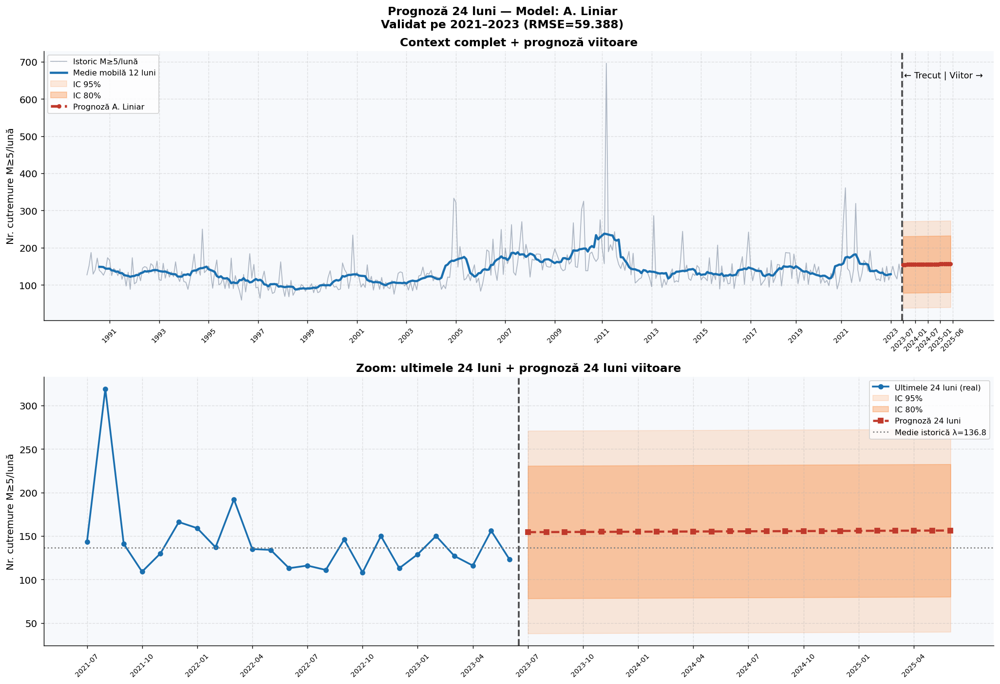

fig5_prognoza_viitor.png


In [ ]:
#  PROGNOZĂ 24 LUNI VIITOARE
#  Folosim modelul cu cel mai mic RMSE din celula anterioară
#  + intervale de încredere 80% și 95%

N_LUNI_VIITOR = 24

print("═"*60)
print(f"  PROGNOZĂ — URMĂTOARELE {N_LUNI_VIITOR} LUNI")
print(f"  Model folosit: {castigator_prog}")
print("═"*60)

ultima_perioada = serie_m5.index[-1]
perioade_viitor = pd.period_range(
    start=ultima_perioada + 1, periods=N_LUNI_VIITOR, freq='M'
)
idx_viitor = np.arange(len(valori), len(valori) + N_LUNI_VIITOR)

# ── Generăm predicțiile cu modelul câștigător ──
if 'Liniar' in castigator_prog:
    pred_viitor = np.maximum(np.polyval(coef_lin, idx_viitor), 0)
elif 'Poisson' in castigator_prog:
    pred_viitor = np.full(N_LUNI_VIITOR, lambda_poisson)
elif 'EWM' in castigator_prog:
    vc = val_curent  # continuăm de unde am rămas
    pred_viitor = []
    for _ in range(N_LUNI_VIITOR):
        pred_viitor.append(vc)
    pred_viitor = np.array(pred_viitor)
else:  # Polinomial
    pred_viitor = np.maximum(np.polyval(coef_pol2, idx_viitor), 0)

# Incertitudine: folosim RMSE din validare ca estimat al erorii standard
rmse_castigator = sorted_modele[0][1]['rmse']
ic80_low  = pred_viitor - 1.282 * rmse_castigator
ic80_high = pred_viitor + 1.282 * rmse_castigator
ic95_low  = pred_viitor - 1.960 * rmse_castigator
ic95_high = pred_viitor + 1.960 * rmse_castigator

# ── Tabel prognoze lunare ──
print(f"\n  {'Luna':<12} {'Predicție':>12} {'IC 80%':>20} {'IC 95%':>22}")
print(f"  {'-'*68}")
for i, (per, pred) in enumerate(zip(perioade_viitor, pred_viitor)):
    print(f"  {str(per):<12} {pred:>12.1f}    "
          f"[{max(0,ic80_low[i]):>5.1f}, {ic80_high[i]:>5.1f}]"
          f"      [{max(0,ic95_low[i]):>5.1f}, {ic95_high[i]:>5.1f}]")

# ── Conversia la probabilitate M≥5 pe lună (model Poisson) ──
print(f"\n  Probabilitate cel puțin 1 cutremur M≥5 pe lună:")
print(f"  (P = 1 – e^(–λ), unde λ = predicția lunară / zile)")
for i, (per, lam) in enumerate(zip(perioade_viitor[:6], pred_viitor[:6])):
    p = 1 - np.exp(-lam)
    print(f"  {str(per)}: λ={lam:.1f}  →  P(M≥5) = {p:.4f} = {p*100:.2f}%")


#  GRAFIC PROGNOZĂ CU IC

fig, axes = plt.subplots(2, 1, figsize=(16, 11))
fig.suptitle(f"Prognoză {N_LUNI_VIITOR} luni — Model: {castigator_prog}\n"
             f"Validat pe {AN_TEST_SERIE}–2023 (RMSE={rmse_castigator:.3f})",
             fontsize=13, fontweight='bold')

# ── Sus: context complet + prognoză ──
ax = axes[0]
ax.set_facecolor('#f7f9fc')
x_tot      = np.arange(len(valori))
etichete_x = [str(p) for p in serie_m5.index]

# Date istorice
ax.plot(x_tot, valori, color='#64748b', linewidth=1, alpha=0.5, label='Istoric M≥5/lună')
mm12_tot = pd.Series(valori).rolling(12, center=True).mean()
ax.plot(x_tot, mm12_tot, color='#1a6faf', linewidth=2.5, label='Medie mobilă 12 luni')

# Zona de prognoză
ax.fill_between(idx_viitor,
                np.maximum(ic95_low, 0), ic95_high,
                color='#f97316', alpha=0.15, label='IC 95%')
ax.fill_between(idx_viitor,
                np.maximum(ic80_low, 0), ic80_high,
                color='#f97316', alpha=0.30, label='IC 80%')
ax.plot(idx_viitor, pred_viitor,
        color='#c0392b', linewidth=3, linestyle='--',
        marker='o', markersize=4, label=f'Prognoză {castigator_prog}', zorder=6)

# Linie separator
ax.axvline(len(valori) - 0.5, color='black', linestyle='--',
           linewidth=2, alpha=0.7)
ax.text(len(valori) + 0.5, ax.get_ylim()[1] * 0.9,
        '← Trecut | Viitor →', fontsize=10, color='black')

# Tick-uri pe ani
tick_luni = [i for i, p in enumerate(serie_m5.index) if p.month == 1]
tick_ani  = [str(serie_m5.index[i].year) for i in tick_luni]
future_ticks  = [len(valori) + i*6 for i in range(N_LUNI_VIITOR//6 + 1)]
future_labels = [str(perioade_viitor[min(i*6, N_LUNI_VIITOR-1)]) for i in range(N_LUNI_VIITOR//6 + 1)]
ax.set_xticks(tick_luni[::2] + future_ticks)
ax.set_xticklabels(tick_ani[::2] + future_labels, rotation=45, fontsize=8)
ax.set_ylabel("Nr. cutremure M≥5/lună")
ax.set_title("Context complet + prognoză viitoare")
ax.legend(fontsize=9, loc='upper left')

# ── Jos: zoom pe prognoze ──
ax2 = axes[1]
ax2.set_facecolor('#f7f9fc')

# Ultimele 24 luni istorice
ultim_24_idx  = x_tot[-24:]
ultim_24_vals = valori[-24:]
ax2.plot(range(24), ultim_24_vals,
         color='#1a6faf', linewidth=2, marker='o', markersize=5,
         label='Ultimele 24 luni (real)')

# Prognoze
ax2.fill_between(range(24, 24 + N_LUNI_VIITOR),
                 np.maximum(ic95_low, 0), ic95_high,
                 color='#f97316', alpha=0.15, label='IC 95%')
ax2.fill_between(range(24, 24 + N_LUNI_VIITOR),
                 np.maximum(ic80_low, 0), ic80_high,
                 color='#f97316', alpha=0.30, label='IC 80%')
ax2.plot(range(24, 24 + N_LUNI_VIITOR), pred_viitor,
         color='#c0392b', linewidth=2.5, linestyle='--',
         marker='s', markersize=5,
         label=f'Prognoză {N_LUNI_VIITOR} luni', zorder=6)

ax2.axvline(23.5, color='black', linestyle='--', linewidth=2, alpha=0.7)
ax2.axhline(lambda_poisson, color='gray', linestyle=':',
            linewidth=1.5, label=f'Medie istorică λ={lambda_poisson:.1f}')

# Etichete pe axa x
etichete_zoom = (
    [str(serie_m5.index[-24 + i]) for i in range(0, 24, 3)] +
    [str(perioade_viitor[i])       for i in range(0, N_LUNI_VIITOR, 3)]
)
ax2.set_xticks(list(range(0, 24, 3)) + list(range(24, 24+N_LUNI_VIITOR, 3)))
ax2.set_xticklabels(etichete_zoom, rotation=45, fontsize=8)
ax2.set_ylabel("Nr. cutremure M≥5/lună")
ax2.set_title(f"Zoom: ultimele 24 luni + prognoză {N_LUNI_VIITOR} luni viitoare")
ax2.legend(fontsize=9, loc='upper right')

plt.tight_layout()
plt.savefig('fig5_prognoza_viitor.png', dpi=130, bbox_inches='tight')
plt.show()
print("fig5_prognoza_viitor.png")

  REZUMAT FINAL — PROIECT EDA CUTREMURE

      Comparație modele distribuție magnitudini 

    Model câștigător: Gutenberg-Richter                  
    R²=0.94682 (Gutenberg-Richter ) vs R²=0.31302 (Exp.)         
    Legea Gutenberg-Richter  și modelul exponențial sunt practic        
    echivalente matematic (β/ln10 ≈ b-value)             
    GPD modelează coada (M≥5) cu R²=0.91132        
 

     Comparație modele prognoză temporală 

    Rang  Model                        RMSE     MAE    MAPE  
    #1🏆  A. Liniar                  59.388  37.175   21.9%  
    #2    D. Polinomial g.2          60.038  32.379   17.1%  
    #3    B. Poisson (λ fix)         61.221  32.445   16.7%  
    #4    C. EWM (α=0.15)            63.265  40.794   23.8%  


      Prognoză 24 luni viitoare 
    Model: A. Liniar                                      
    Medie estimată/lună:  155.3 cutremure M≥5         
   Interval 95%: [ 38.9, 271.7] cutremure/lună       
                                           

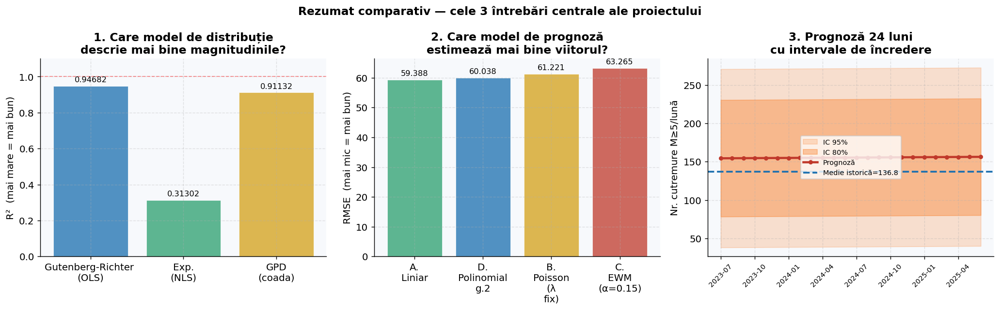


 Proiect complet!
Grafice generate: fig1–fig6_*.png


In [ ]:
# CONCLUZII FINALE + GRAFIC REZUMAT COMPARATIV

print("  REZUMAT FINAL — PROIECT EDA CUTREMURE")

print(f"""
      Comparație modele distribuție magnitudini

    Model câștigător: {castigator:<35}
    R²={r2_gr:.5f} (Gutenberg-Richter ) vs R²={r2_exp:.5f} (Exp.)
    Legea Gutenberg-Richter  și modelul exponențial sunt practic
    echivalente matematic (β/ln10 ≈ b-value)
    GPD modelează coada (M≥5) cu R²={r2_gpd:.5f}


     Comparație modele prognoză temporală

    {'Rang':>4}  {'Model':<25} {'RMSE':>7} {'MAE':>7} {'MAPE':>7}  """)
for rang, (nm, mt) in enumerate(sorted_modele, 1):
    stea = "🏆" if rang==1 else "  "
    print(f"    #{rang}{stea}  {nm:<25} {mt['rmse']:>7.3f} {mt['mae']:>7.3f} {mt['mape']:>6.1f}%  ")
print(f"""

      Prognoză {N_LUNI_VIITOR} luni viitoare
    Model: {castigator_prog:<47}
    Medie estimată/lună: {pred_viitor.mean():>6.1f} cutremure M≥5
   Interval 95%: [{max(0,ic95_low.mean()):>5.1f}, {ic95_high.mean():>5.1f}] cutremure/lună

        LIMITARE IMPORTANTĂ:
    Modelele statistice estimează FRECVENȚA,
    nu momentul exact al unui cutremur specific.
    Un cutremur major (M≥7) rămâne impredictibil
    ca timing exact — modelul Gutenberg-Richter dă doar
    probabilitatea pe un interval de timp.

""")

# ── Grafic rezumat comparativ ──
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Rezumat comparativ — cele 3 întrebări centrale ale proiectului",
             fontsize=13, fontweight='bold')

# ── 1. Care model de distribuție e mai bun? ──
ax = axes[0]
ax.set_facecolor('#f7f9fc')
modele_dist  = ['Gutenberg-Richter \n(OLS)', 'Exp.\n(NLS)', 'GPD\n(coada)']
r2_values    = [r2_gr, r2_exp, r2_gpd]
culori_dist  = ['#1a6faf', '#2a9e6e', '#d4a017']
bars = ax.bar(modele_dist, r2_values, color=culori_dist, alpha=0.75,
              edgecolor='white', linewidth=0.5)
ax.bar_label(bars, labels=[f'{v:.5f}' for v in r2_values], fontsize=9, padding=3)
ax.set_ylim(0, 1.1)
ax.set_ylabel("R²  (mai mare = mai bun)")
ax.set_title("1. Care model de distribuție\ndescrie mai bine magnitudinile?")
ax.axhline(1.0, color='red', linestyle='--', alpha=0.4, linewidth=1)

# ── 2. Care model de prognoză e mai bun? ──
ax = axes[1]
ax.set_facecolor('#f7f9fc')
nm_prog  = [nm.replace(' ', '\n') for nm, _ in sorted_modele]
rmse_val = [mt['rmse'] for _, mt in sorted_modele]
culori_p = ['#2a9e6e', '#1a6faf', '#d4a017', '#c0392b']
bars2 = ax.bar(nm_prog, rmse_val, color=culori_p, alpha=0.75,
               edgecolor='white', linewidth=0.5)
ax.bar_label(bars2, labels=[f'{v:.3f}' for v in rmse_val], fontsize=9, padding=3)
ax.set_ylabel("RMSE  (mai mic = mai bun)")
ax.set_title("2. Care model de prognoză\nestimează mai bine viitorul?")

# ── 3. Prognoze vs. medie istorică ──
ax = axes[2]
ax.set_facecolor('#f7f9fc')
luni_label = [str(p)[-7:] for p in perioade_viitor[::3]]
x_prog     = range(0, N_LUNI_VIITOR, 3)
ax.fill_between(range(N_LUNI_VIITOR),
                np.maximum(ic95_low, 0), ic95_high,
                color='#f97316', alpha=0.2, label='IC 95%')
ax.fill_between(range(N_LUNI_VIITOR),
                np.maximum(ic80_low, 0), ic80_high,
                color='#f97316', alpha=0.35, label='IC 80%')
ax.plot(pred_viitor, color='#c0392b', linewidth=2.5,
        marker='o', markersize=4, label='Prognoză')
ax.axhline(lambda_poisson, color='#1a6faf', linestyle='--',
           linewidth=2, label=f'Medie istorică={lambda_poisson:.1f}')
ax.set_xticks(list(x_prog))
ax.set_xticklabels(luni_label, rotation=45, fontsize=8)
ax.set_ylabel("Nr. cutremure M≥5/lună")
ax.set_title(f"3. Prognoză {N_LUNI_VIITOR} luni\ncu intervale de încredere")
ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig('fig6_rezumat_comparativ.png', dpi=130, bbox_inches='tight')
plt.show()
print("\n Proiect complet!")
print("Grafice generate: fig1–fig6_*.png")

In [ ]:
#  HARTĂ GLOBALĂ INTERACTIVĂ

#  Vizualizare spațială a tuturor cutremurelor
#  + filtrate pe clasă de magnitudine

import plotly.graph_objects as go

print("Generare hartă globală interactivă")

# ── Pregătire date ──
df_harta = df[
    df['latitude'].notna()  &
    df['longitude'].notna() &
    df['magnitude'].notna() &
    df['depth'].notna()
].copy()

# Eșantion stratificat pe clase — păstrăm TOATE cutremurele mari
df_minor  = df_harta[df_harta['magnitude'] < 5.0].sample(
                n=min(10_000, (df_harta['magnitude'] < 5.0).sum()),
                random_state=42)
df_mare   = df_harta[df_harta['magnitude'] >= 5.0]   # toate
df_harta  = pd.concat([df_minor, df_mare]).reset_index(drop=True)

print(f"  Puncte afișate: {len(df_harta):,}  "
      f"(din care M≥5: {len(df_mare):,})")

# ── Etichetă hover ──
df_harta['hover'] = df_harta.apply(
    lambda r: (
        f"<b>M {r['magnitude']:.1f}</b><br>"
        f"Adâncime: {r['depth']:.0f} km<br>"
        f"Lat: {r['latitude']:.2f}°  Lon: {r['longitude']:.2f}°<br>"
        f"An: {int(r['year']) if pd.notna(r.get('year')) else 'N/A'}"
    ), axis=1
)

# ── Straturi pe clase de magnitudine ──
straturi = [
    (2.0, 4.9, '#3b82f6', 'Minor / Ușor  (2.0–4.9)',  3,  0.45),
    (5.0, 5.9, '#22c55e', 'Moderat       (5.0–5.9)',   6,  0.60),
    (6.0, 6.9, '#eab308', 'Puternic      (6.0–6.9)',   9,  0.75),
    (7.0, 7.9, '#f97316', 'Major         (7.0–7.9)',  13,  0.85),
    (8.0, 10., '#dc2626', 'Uriaș         (8.0+)',     18,  1.00),
]

fig_harta = go.Figure()

for m_min, m_max, culoare, eticheta, marime, opacitate in straturi:
    sub = df_harta[
        (df_harta['magnitude'] >= m_min) &
        (df_harta['magnitude'] <= m_max)
    ]
    if len(sub) == 0:
        continue

    fig_harta.add_trace(go.Scattergeo(
        lon=sub['longitude'],
        lat=sub['latitude'],
        mode='markers',
        marker=dict(
            size=marime,
            color=culoare,
            opacity=opacitate,
            line=dict(width=0.4, color='white'),
        ),
        text=sub['hover'],
        hovertemplate='%{text}<extra></extra>',
        name=f"{eticheta}  (n={len(sub):,})",
    ))

# ── Adăugăm separat top 20 cele mai mari cutremure ──
top20 = df_harta.nlargest(20, 'magnitude')
fig_harta.add_trace(go.Scattergeo(
    lon=top20['longitude'],
    lat=top20['latitude'],
    mode='markers+text',
    marker=dict(
        size=22,
        color='#7c3aed',
        symbol='star',
        opacity=1.0,
        line=dict(width=1, color='white'),
    ),
    text=top20['magnitude'].apply(lambda m: f"M{m:.1f}"),
    textposition='top center',
    textfont=dict(size=9, color='white'),
    hovertemplate=(
        top20['hover'] +
        "<br><b> Top 20 cele mai mari!</b>"
        "<extra></extra>"
    ),
    name="Top 20 cutremure",
))

# ── Layout ──
fig_harta.update_layout(
    title=dict(
        text=(
            "Harta globală interactivă a cutremurelor (1990–2023)<br>"
            "<sup>Click pe legendă pentru a filtra clase  |  "
            "Zoom cu scroll  |  "
            "Hover pe puncte pentru detalii  |  "
            "Top 20 cele mai mari cutremure înregistrate</sup>"
        ),
        x=0.5,
        font=dict(size=14),
    ),
    geo=dict(
        showland=True,        landcolor='#e8e8d8',
        showocean=True,       oceancolor='#b8d4e8',
        showcountries=True,   countrycolor='#aaaaaa',
        showcoastlines=True,  coastlinecolor='#888888',
        coastlinewidth=0.7,
        showframe=False,
        showlakes=True,       lakecolor='#b8d4e8',
        projection_type='natural earth',
        bgcolor='#f0f4f8',
        lataxis=dict(range=[-70, 80]),
        lonaxis=dict(range=[-180, 180]),
    ),
    legend=dict(
        title=dict(
            text='Clasă magnitudine<br><sup>(click pentru on/off)</sup>',
            font=dict(size=11),
        ),
        itemsizing='constant',
        x=0.01, y=0.01,
        bgcolor='rgba(255,255,255,0.90)',
        bordercolor='#cccccc',
        borderwidth=1,
        font=dict(size=10),
    ),
    width=1050,
    height=600,
    paper_bgcolor='#f0f4f8',
    margin=dict(l=0, r=0, t=90, b=0),
)

fig_harta.show()

# ── Statistici rapide pe regiuni ──
print("\n  Top 10 regiuni cu cele mai multe cutremure M≥6:")
if 'place' in df_raw.columns:
    df_raw['region'] = df_raw['place'].str.extract(r',\s*(.+)$')[0].str.strip()
    top_reg = (
        df_raw[pd.to_numeric(df_raw['magnitudo'], errors='coerce') >= 6.0]
        ['region']
        .value_counts()
        .head(10)
    )
    for i, (reg, cnt) in enumerate(top_reg.items(), 1):
        bar = '█' * min(int(cnt / top_reg.max() * 25), 25)
        print(f"  {i:>2}. {str(reg):<40} {cnt:>5,}  {bar}")
else:
    # Dacă nu există coloana place, grupăm pe zone geografice
    df_zone = df_harta[df_harta['magnitude'] >= 6.0].copy()
    df_zone['zona_lat'] = pd.cut(
        df_zone['latitude'],
        bins=[-90, -23.5, 23.5, 66.5, 90],
        labels=['Sud (sub -23.5°)', 'Tropicale', 'Temperate N', 'Polare N']
    )
    print(df_zone.groupby('zona_lat', observed=True).size()
                 .sort_values(ascending=False).to_string())

print("\n Harta interactivă generată!")
print("   → Click pe clase din legendă pentru a le ascunde/afișa")
print("   → Stelele violet = top 20 cele mai mari cutremure din dataset")
print("   → Zoom cu scroll | Pan cu drag | Hover pentru detalii complete")

Generare hartă globală interactivă
  Puncte afișate: 64,831  (din care M≥5: 54,831)



  Top 10 regiuni cu cele mai multe cutremure M≥6:
   1. Indonesia                                  534  █████████████████████████
   2. Papua New Guinea                           373  █████████████████
   3. Japan                                      332  ███████████████
   4. Vanuatu                                    227  ██████████
   5. Chile                                      203  █████████
   6. Russia                                     202  █████████
   7. Tonga                                      194  █████████
   8. Philippines                                180  ████████
   9. Alaska                                     155  ███████
  10. Solomon Islands                            152  ███████

 Harta interactivă generată!
   → Click pe clase din legendă pentru a le ascunde/afișa
   → Stelele violet = top 20 cele mai mari cutremure din dataset
   → Zoom cu scroll | Pan cu drag | Hover pentru detalii complete
